In [2]:
import time
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import utils, datasets, transforms, models
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pickle


### MNIST

In [3]:
dataroot = "../data/MNIST"  # 数据集所在的路径，我们已经事先下载下来了
workers = 10  # 数据加载时的进程数
batch_size = 64  # 生成器输入的大小

image_size = 64  # 训练图像的大小
nc = 1  # 训练图像的通道数，彩色图像的话就是 3
nz = 100  # 输入是100 维的随机噪声 z，看作是 100 个 channel，每个特征图宽高是 1*1
ngf = 64  # 生成器中特征图的大小，
ndf = 64  # 判别器中特征图的大小
num_epochs = 5  # 训练的轮次
# num_epochs = 10  # 训练的轮次
lr = 0.0005  # 学习率大小
beta1 = 0.5  # Adam 优化器的参数
ngpu = 1  # 可用 GPU  的个数，0 代表使用 CPU

# 训练集加载并进行归一化等操作
train_data = datasets.MNIST(
    root=dataroot,
    train=True,
    transform=transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, ), (0.5, ))
    ]),
    download=True  # 从互联网下载，如果已经下载的话，就直接使用
)

# 测试集加载并进行归一化等操作
test_data = datasets.MNIST(root=dataroot,
                           train=False,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, ), (0.5, ))
                           ]))

# 把 MNIST 的训练集和测试集都用来做训练
# dataset = train_data + test_data
# dataset = train_data

from torch.utils.data import Subset
# 选择训练集的前 5000 张数据
subset_indices = list(range(5000))  # 创建索引范围
dataset = Subset(train_data, subset_indices)

print(f'Total Size of Dataset: {len(dataset)}')

# 数据加载器，训练过程中不断产生数据
dataloader = DataLoader(dataset=dataset,
                        batch_size=batch_size,
                        shuffle=True,
                        num_workers=workers)

# 看是否存在可用的 GPU
device = torch.device('cuda:0' if (
    torch.cuda.is_available() and ngpu > 0) else 'cpu')

# 权重初始化函数
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# # new
# def weights_init(m):
#     classname = m.__class__.__name__
#     if classname.find('Conv') != -1:
#         # 使用Xavier初始化卷积层  根据输入和输出神经元的数量动态调整权重的初始化范围
#         nn.init.xavier_uniform_(m.weight.data)
#         # nn.init.kaiming_normal_(m.weight, a=0.2)  # 对LeakyReLU特别有效
#     elif classname.find('BatchNorm') != -1:
#         # 使用标准正态分布初始化BatchNorm层
#         nn.init.normal_(m.weight.data, 1.0, 0.02)
#         nn.init.constant_(m.bias.data, 0)


Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 9912422/9912422 [02:38<00:00, 62733.49it/s] 


Extracting ../data/MNIST/MNIST/raw/train-images-idx3-ubyte.gz to ../data/MNIST/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 28881/28881 [00:00<00:00, 53175.12it/s]


Extracting ../data/MNIST/MNIST/raw/train-labels-idx1-ubyte.gz to ../data/MNIST/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 1648877/1648877 [00:18<00:00, 88276.27it/s] 


Extracting ../data/MNIST/MNIST/raw/t10k-images-idx3-ubyte.gz to ../data/MNIST/MNIST/raw

Failed to download (trying next):
HTTP Error 404: Not Found



100%|██████████| 4542/4542 [00:00<00:00, 4897308.17it/s]


Extracting ../data/MNIST/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../data/MNIST/MNIST/raw

Total Size of Dataset: 5000


In [3]:
pip install gdown

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10/10 [gdown]m 8/10 [beautifulsoup4]
Note: you may need to restart the kernel to use updated packages.


### celeba

In [1]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import torchvision.utils as vutils

dataroot = "data/"  # 数据集所在的路径
workers = 10  # 数据加载时的进程数
batch_size = 64  # 生成器输入的大小

image_size = 64  # 训练图像的大小
nc = 3  # 训练图像的通道数，CelebA是彩色图像
nz = 100  # 输入是100维的随机噪声 z
ngf = 64  # 生成器中特征图的大小
ndf = 64  # 判别器中特征图的大小
num_epochs = 1  # 训练的轮次
lr = 0.0005  # 学习率大小
beta1 = 0.5  # Adam 优化器的参数
ngpu = 1  # 可用 GPU 的个数，0 代表使用 CPU

# 训练集加载并进行归一化等操作
train_data = datasets.CelebA(
    root=dataroot,
    split='train',
    transform=transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # CelebA的RGB通道归一化
    ]),
    download=True  # 从互联网下载，如果已经下载的话，就直接使用
)

# 测试集加载并进行归一化等操作
test_data = datasets.CelebA(
    root=dataroot,
    split='test',
    transform=transforms.Compose([
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # CelebA的RGB通道归一化
    ]),
    download=True  # 从互联网下载，如果已经下载的话，就直接使用
)

# 把 CelebA 的训练集和测试集都用来做训练
dataset = train_data + test_data
print(f'Total Size of Dataset: {len(dataset)}')

# 数据加载器，训练过程中不断产生数据
dataloader = DataLoader(dataset=dataset,
                        batch_size=batch_size,
                        shuffle=True,
                        num_workers=workers)

# # We can use an image folder dataset the way we have it setup.
# # Create the dataset
# dataset = datasets.ImageFolder(root=dataroot,
#                            transform=transforms.Compose([
#                                transforms.Resize(image_size),
#                                transforms.CenterCrop(image_size),
#                                transforms.ToTensor(),
#                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
#                            ]))
# # Create the dataloader
# dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
#                                          shuffle=True, num_workers=workers)

# Decide which device we want to run on
# device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
device = torch.device("cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
# 权重初始化函数
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


KeyboardInterrupt: 

### CIFAR10

In [1]:


from torchvision import datasets, transforms
from torch.utils.data import DataLoader

dataroot = "data/"  # 数据集所在的路径
workers = 10  # 数据加载时的进程数
batch_size = 64  # 生成器输入的大小

image_size = 64  # 训练图像的大小
nc = 3  # 训练图像的通道数，CelebA是彩色图像
nz = 100  # 输入是100维的随机噪声 z
ngf = 64  # 生成器中特征图的大小
ndf = 64  # 判别器中特征图的大小
num_epochs = 5  # 训练的轮次
lr = 0.0005  # 学习率大小
beta1 = 0.5  # Adam 优化器的参数
ngpu = 1  # 可用 GPU 的个数，0 代表使用 CPU

# 训练集加载并进行归一化等操作
train_data = datasets.CIFAR10(root=dataroot, download=True,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                           ]))




# 测试集加载并进行归一化等操作
test_data = datasets.CIFAR10(root=dataroot, download=False,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                           ]))
# 把 CelebA 的训练集和测试集都用来做训练
dataset = train_data + test_data
print(f'Total Size of Dataset: {len(dataset)}')

# 数据加载器，训练过程中不断产生数据
dataloader = DataLoader(dataset=dataset,
                        batch_size=batch_size,
                        shuffle=True,
                        num_workers=workers)

# 看是否存在可用的 GPU
device = torch.device('cuda:0' if (
    torch.cuda.is_available() and ngpu > 0) else 'cpu')

# 权重初始化函数
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


100.0%


Extracting data/cifar-10-python.tar.gz to data/
Total Size of Dataset: 100000


NameError: name 'torch' is not defined

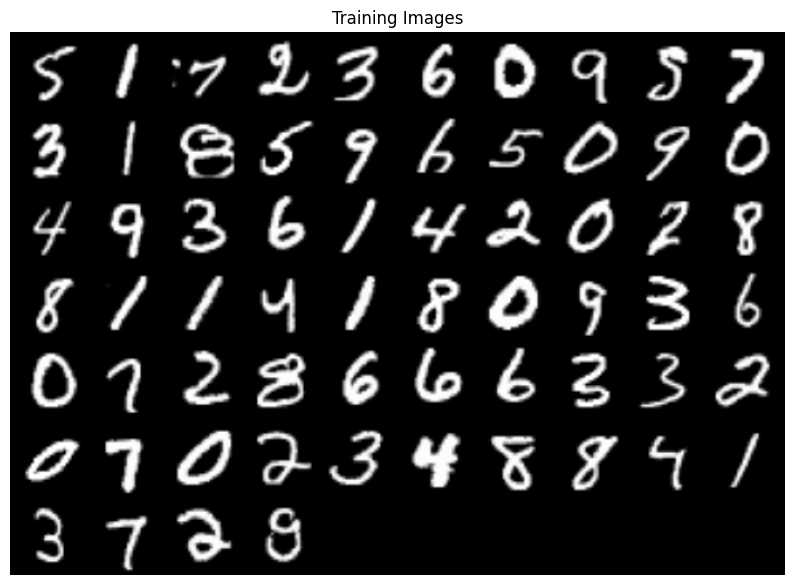

In [5]:
inputs = next(iter(dataloader))[0]
plt.figure(figsize=(10, 10))
plt.title("Training Images")
plt.axis('off')
inputs = utils.make_grid(inputs[:100] * 0.5 + 0.5, nrow=10)
plt.imshow(inputs.permute(1, 2, 0))


In [6]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.decon1 = nn.ConvTranspose2d(in_channels=nz, 
                                                 out_channels=ngf*8,
                                                 kernel_size=4, 
                                                 stride=1, 
                                                 padding=0,
                                                 bias=False)
        self.bn1 = nn.BatchNorm2d(ngf*8)
        self.decon2 = nn.ConvTranspose2d(ngf*8, ngf*4, 4, stride=2, padding=1, bias=False)  
        self.bn2 = nn.BatchNorm2d(ngf*4)
        self.decon3 = nn.ConvTranspose2d(ngf*4, ngf*2, 4, stride=2, padding=1, bias=False)  
        self.bn3 = nn.BatchNorm2d(ngf*2)
        self.decon4 = nn.ConvTranspose2d(ngf*2, ngf, 4, stride=2, padding=1, bias=False)  
        self.bn4 = nn.BatchNorm2d(ngf)
        self.decon5 = nn.ConvTranspose2d(ngf, nc, 4, stride=2, padding=1, bias=False)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.decon1(x))
        x = self.bn1(x)
        x = self.relu(self.decon2(x))
        x = self.bn2(x)
        x = self.relu(self.decon3(x))
        x = self.bn3(x)
        x = self.relu(self.decon4(x))
        x = self.bn4(x)
        x = self.decon5(x)
        x = x.tanh()
        return x

# class Generator(nn.Module):
#     def __init__(self, ngpu):
#         super(Generator, self).__init__()
#         self.ngpu = ngpu
#         self.main = nn.Sequential(
#             # input is Z, going into a convolution
#             nn.ConvTranspose2d(in_channels=nz,
#                                out_channels=ngf * 8,
#                                kernel_size=4,
#                                stride=1,
#                                padding=0,
#                                bias=False),
#             nn.BatchNorm2d(ngf * 8),
#             nn.ReLU(True),
#             # 当前特征图大小  (ngf*8) x 4 x 4
#             nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 4),
#             nn.ReLU(True),
#             # 当前特征图大小 (ngf*4) x 8 x 8
#             nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 2),
#             nn.ReLU(True),
#             # 当前特征图大小 (ngf*2) x 16 x 16
#             nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf),
#             nn.ReLU(True),
#             # 当前特征图大小 (ngf) x 32 x 32
#             nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
#             # nn.Dropout(0.3), # new
#             nn.Tanh()
#             # 当前特征图大小 (nc) x 64 x 64
#         )

#     def forward(self, input):
#         return self.main(input)

# class Generator(nn.Module):
#     def __init__(self, ngpu):
#         super(Generator, self).__init__()
#         self.ngpu = ngpu
#         self.main = nn.Sequential(
#             # input is Z, going into a convolution
#             nn.ConvTranspose2d(in_channels=nz,
#                                out_channels=ngf * 4,
#                                kernel_size=4,
#                                stride=1,
#                                padding=0,
#                                bias=False),
#             nn.BatchNorm2d(ngf * 4),
#             nn.ReLU(True),
#             # 当前特征图大小  (ngf*8) x 4 x 4
#             nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 2),
#             nn.ReLU(True),
#             # 当前特征图大小 (ngf*4) x 8 x 8
#             nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf),
#             nn.ReLU(True),
#             # 当前特征图大小 (ngf) x 32 x 32
#             nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
#             # nn.Dropout(0.3), # new
#             nn.Tanh()
#             # 当前特征图大小 (nc) x 64 x 64
#         )

#     def forward(self, input):
#         return self.main(input)

In [7]:
# class Discriminator(nn.Module):
#     def __init__(self, ngpu):
#         super(Discriminator, self).__init__()
#         self.ngpu = ngpu
#         self.main = nn.Sequential(
#             # 输入 (nc) x 64 x 64
#             nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
#             nn.LeakyReLU(0.2, inplace=True),
#             # 当前特征图大小 (ndf) x 32 x 32
#             nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 2),
#             nn.LeakyReLU(0.2, inplace=True),
#             # 当前特征图大小 (ndf*2) x 16 x 16
#             nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 4),
#             nn.LeakyReLU(0.2, inplace=True),
#             # 当前特征图大小 (ndf*4) x 8 x 8
#             nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 8),
#             nn.LeakyReLU(0.2, inplace=True),
#             # 当前特征图大小 (ndf*8) x 4 x 4
#             nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
#             # 当前特征图大小 (1) x 1 x 1
#             nn.Sigmoid())
        

#     def forward(self, input):
#         return self.main(input)

# class Discriminator(nn.Module):
#     def __init__(self, ngpu):
#         super(Discriminator, self).__init__()
#         self.ngpu = ngpu
#         self.main = nn.Sequential(

#             nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
#             nn.LeakyReLU(0.2, inplace=True),

#             nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 2),
#             nn.LeakyReLU(0.2, inplace=True),
     
#             nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 4),
#             nn.LeakyReLU(0.2, inplace=True),
 
#             nn.Conv2d(ndf * 4, 1, 1, 1, 0, bias=False),  # kernel_size=4

#             nn.Sigmoid())
#             # nn.Dropout(0.3)) # new

#     def forward(self, input):
#         output = self.main(input)  # Output shape: [128, 1, 5, 5]
#         output = output.view(output.size(0), -1).mean(dim=1)  # Flatten and take mean
#         return output

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.nc = nc 
        self.ndf = ndf
        self.conv1 = nn.Conv2d(nc, ndf, 4, stride=2, padding=1, bias=False)  # (64, 14, 14)
        self.leaky_relu = nn.LeakyReLU(0.2)
        self.conv2 = nn.Conv2d(ndf, ndf * 2, 4, stride=2, padding=1, bias=False)  # (128, 7, 7)
        self.bn1 = nn.BatchNorm2d(ndf * 2)
        self.conv3 = nn.Conv2d(ndf * 2, ndf * 4, 4, stride=2, padding=1, bias=False)  # (256, 3, 3)
        self.bn2 = nn.BatchNorm2d(ndf * 4)
        self.conv4 = nn.Conv2d(ndf * 4, 1, 1, stride=1, padding=0, bias=False)  # (1, 1, 1)
        # self.conv4 = nn.Conv2d(ndf * 4, 1, 4, stride=1, padding=0, bias=False)  # (1, 1, 1)
        self.sd = nn.Sigmoid()

    def forward(self, x):
        x = self.conv1(x)
        # print("conv1:", x)
        x = self.leaky_relu(x)
        # print("leaky_relu:", x)
        x = self.conv2(x)
        x = self.bn1(x)
        x = self.leaky_relu(x)
        x = self.leaky_relu(self.bn2(self.conv3(x)))
        x = self.sd(self.conv4(x))

        return x.view(x.size(0), -1).mean(dim=1)


In [8]:
# 创建一个生成器对象
netG = Generator(ngpu).to(device)
# 多卡并行，如果有多卡的话
if device.type == 'cuda' and ngpu > 1:
    netG = nn.DataParallel(netG, list(range(ngpu)))

# # 初始化权重  其中，mean=0, stdev=0.2.
# netG.apply(weights_init)
for layer in netG.children():
    weights_init(layer)

# 创建一个判别器对象
netD = Discriminator(ngpu).to(device)
# 多卡并行，如果有多卡的话
if device.type == 'cuda' and ngpu > 1:
    netD = nn.DataParallel(netD, list(range(ngpu)))

# # 初始化权重  其中，mean=0, stdev=0.2.
# netD.apply(weights_init)
for layer in netD.children():
    weights_init(layer)

In [9]:
criterion = nn.BCELoss()  # 定义损失函数

# 创建一批潜在向量，我们将使用它们来可视化生成器的生成过程
fixed_noise = torch.randn(100, nz, 1, 1, device=device)

real_label = 1.  # “真”标签
fake_label = 0.  # “假”标签

# 为生成器和判别器定义优化器
# optimizerG = crypten.optim.SGD(G.parameters(), lr=2e-4, momentum=0.9)
# optimizerD = crypten.optim.SGD(D.parameters(), lr=1e-3, momentum=0.8)

# # 适用于五层结构
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.8)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=8e-4, momentum=0.9)

# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4, momentum=0.8)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-5, momentum=0.9)

# # 生成器5层 判别器4层
# Inception Score: 1.2610 ± 0.2071
# optimizerD = torch.optim.SGD(netD.parameters(), lr=4e-4, momentum=0.9)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4, momentum=0.7)

# # G 训练得更稳定了 应该是因为 D的判别力下降了(动量越低,梯度更新越慢)
# # Inception Score: 1.0164 ± 0.0135
# optimizerD = torch.optim.SGD(netD.parameters(), lr=4e-4, momentum=0.8)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4, momentum=0.9)

# # 两个损失函数能够保持在 一点几左右, 但后续 G还是变弱了
# # Inception Score: 1.1545 ± 0.0624
# optimizerD = torch.optim.SGD(netD.parameters(), lr=4e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4, momentum=0.8)

# # G 后续还是变弱了, 到底是 D过强还是 G过弱的问题 ?
# # Inception Score: 1.1266 ± 0.0551
# optimizerD = torch.optim.SGD(netD.parameters(), lr=4e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=4e-4, momentum=0.9)

# # 去掉对向量的控制后, G更弱了
# # Inception Score: 1.2430 ± 0.0635
# optimizerD = torch.optim.SGD(netD.parameters(), lr=4e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=4e-4)

# # 现在开始，数据集调整为10000 生成器5层 判别器4层
# optimizerD = torch.optim.SGD(netD.parameters(), lr=3e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=4e-4,momentum=0.9)

# # 现在开始，数据集调整为20000 结构为 4层
# # D太强，G越来越弱，但是不会训练得很平缓
# # Inception Score: 1.0619 ± 0.0286
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=3e-4,momentum=0.9)

# # Inception Score: 1.1679 ± 0.0581
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4)

# # Inception Score: 1.0269 ± 0.0145
# # BCEloss
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-4,momentum=0.9)

# # Inception Score: 1.0392 ± 0.0294
# # BCEWithLogitsLoss
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-4,momentum=0.9)

# # Inception Score: 1.0300 ± 0.0193
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  # 减小判别器学习率
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.9)  # 增加生成器学习率

# # Inception Score: 1.0319 ± 0.0148
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-4, momentum=0.9)

# # Inception Score: 1.0861 ± 0.0735
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-4)

# # 修改了初始化权重操作
# # Inception Score: 1.0889 ± 0.0727
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-4)

# # Inception Score: 1.0291 ± 0.0205
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.9)

# # Inception Score: 1.0174 ± 0.0121
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.9)

# # Inception Score: 1.0243 ± 0.0127
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.8)

# # Inception Score: 1.0209 ± 0.0159
# optimizerD = torch.optim.SGD(netD.parameters(), lr=3e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.8)

# # Inception Score: 1.0213 ± 0.0153
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.8)

# # 现在开始，数据集调整为 5000 结构为 4层 epoch=50
# # Inception Score: 1.2580 ± 0.1082
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-4)

# # Inception Score: 1.2782 ± 0.1413
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=9e-4)

# # Inception Score: 1.2035 ± 0.1386
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=3e-4)

# # Inception Score: 1.1615 ± 0.1021
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=4e-4)

# # Inception Score: 1.2073 ± 0.1136
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=4e-3)

# # Inception Score: 1.1668 ± 0.1120
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=4e-3, momentum=0.9)

# # Inception Score: 1.1943 ± 0.0894
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3)

# # Inception Score: 1.1414 ± 0.0833
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=4e-3)

# # Inception Score: 1.1204 ± 0.0861
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=4e-3)

# # 放弃四层， 回归五层
# # num_epochs = 10
# # 气死 根本没学到东西 图都没变化的
# Inception Score: 1.1951 ± 0.0019
# optimizerD = torch.optim.SGD(netD.parameters(), lr=3e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4)

# # 放弃五层，回归4.5层
# # Inception Score: 1.1245 ± 0.0039
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4)

# # 仅削弱对假样本的惩罚
# # Inception Score: 1.3046 ± 0.1331
# optimizerD = torch.optim.SGD(netD.parameters(), lr=5e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # 又减弱生成器压力
# # Inception Score: 1.2465 ± 0.0531
# optimizerD = torch.optim.SGD(netD.parameters(), lr=5e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # 什么都不削弱
# # Inception Score: 1.2502 ± 0.1021
# # 看来是有必要对判别器进行削弱的
# optimizerD = torch.optim.SGD(netD.parameters(), lr=5e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # 以下仅削弱对假样本的惩罚
# # Inception Score: 1.3118 ± 0.0657
# optimizerD = torch.optim.SGD(netD.parameters(), lr=4e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # Inception Score: 1.3757 ± 0.0663
# optimizerD = torch.optim.SGD(netD.parameters(), lr=3e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # Inception Score: 1.4617 ± 0.1135
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # G太强了
# # Inception Score: 1.2221 ± 0.0427
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # Inception Score: 1.4174 ± 0.0873
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=6e-4)

# # Inception Score: 1.2119 ± 0.0714
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4, momentum=0.9)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # 临时改为10000张 Inception Score: 1.1208 ± 0.0156
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # Inception Score: 1.3150 ± 0.1435
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # 50000张 4层 Inception Score: 1.0797 ± 0.0474
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=9e-4)

# # # 仅减弱生成器压力
# # Inception Score: 1.0737 ± 0.0524
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)  
# optimizerG = torch.optim.SGD(netG.parameters(), lr=9e-4)

# # 50000， 回归4.5层，什么都不削弱
# # Inception Score: 1.1191 ± 0.1911
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4)

# # 50000，回归5层，什么都不削弱
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.8)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=8e-4, momentum=0.9)

# # Inception Score: 1.0203 ± 0.0107
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.9)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-3, momentum=0.8)

# # Inception Score: 2.2829 ± 0.2552
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.8)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=8e-4, momentum=0.9)

# # 20000 Inception Score: 1.8043 ± 0.3146
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.8)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=8e-4, momentum=0.9)

# # 20000 Inception Score: 1.0346 ± 0.0150
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.9)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=8e-4, momentum=0.8)

# # 20000 Inception Score: 1.7741 ± 0.3962
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.8)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=7e-4, momentum=0.9)

# # 20000 Inception Score: 1.8054 ± 0.3317
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.8)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=9e-4, momentum=0.9)

# # Inception Score: 2.2491 ± 0.3570
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.8)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-3, momentum=0.9)

# # Inception Score: 1.0169 ± 0.0098
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.9)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-3, momentum=0.8)

# # Inception Score: 1.1186 ± 0.0530
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.4)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4, momentum=0.5)

# # Inception Score: 1.0572 ± 0.0440
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4, momentum=0.4)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4, momentum=0.5)

# # Inception Score: 1.0683 ± 0.0346
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-4, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.1206 ± 0.0598
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-4, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.0757 ± 0.0287
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.0584 ± 0.0104 生成器的变化不大了，得降低动量
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.5)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.0553 ± 0.0194
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.2)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)

# # Inception Score: 1.0629 ± 0.0267
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)

# # Inception Score: 1.0454 ± 0.0254 D始终变化很小
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)

# # Inception Score: 1.0339 ± 0.0191
# optimizerG = torch.optim.SGD(netG.parameters(), lr=5e-3)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-3)

# # Inception Score: 1.0351 ± 0.0302
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-3)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-3)

# # # Inception Score: 1.1691 ± 0.2232
# optimizerG = torch.optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
# optimizerD = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))

# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-4)

# # 在5层生成器，4层鉴别器下
# # Inception Score: 2.3193 ± 0.2252
# optimizerG = torch.optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
# optimizerD = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))

# # Inception Score: 1.3271 ± 0.2237
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.0637 ± 0.0324
# optimizerG = torch.optim.SGD(netG.parameters(), lr=8e-4, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.2825 ± 0.3276
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=4e-4)

# # Inception Score: 1.2825 ± 0.3276
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.2)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.4113 ± 0.2747 
# # epoch = 10
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.2524 ± 0.3076
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-3)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.1306 ± 0.1615
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-4)

# # Inception Score: 1.2743 ± 0.3031
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=3e-4)

# # Inception Score: 1.6238 ± 0.2839
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=4e-4)

# # Inception Score: 1.7131 ± 0.2164
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=5e-4)

# # 4层 Inception Score: 1.0425 ± 0.0259
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-3, momentum=0.1)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=5e-4)

# optimizer_G = torch.optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
# optimizer_D = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))

# # Inception Score: 2.3878 ± 0.2166 非常成功
# optimizerG = torch.optim.SGD(netG.parameters(), lr=1e-2)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=1e-2)

# # Inception Score: 2.4468 ± 0.1433
# optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-2)
# optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-2)

optimizerG = torch.optim.SGD(netG.parameters(), lr=2e-2)
optimizerD = torch.optim.SGD(netD.parameters(), lr=2e-2)

In [12]:
# Calculate losses
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
        
    # numerically stable loss
    criterion = nn.BCELoss()
    # criterion = nn.BCEWithLogitsLoss()

    # calculate loss
    eps = 2 ** -16
    y_pred = torch.clamp(D_out.squeeze(), eps, 1 - eps)  # eps 是一个很小的值，如 1e-7
    loss = criterion(y_pred, labels)
    return loss

def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    criterion = nn.BCELoss()
    # criterion = nn.BCEWithLogitsLoss()

    # calculate loss
    eps = 2 ** -16
    y_pred = torch.clamp(D_out.squeeze(), eps, 1 - eps)  # eps 是一个很小的值，如 1e-7
    loss = criterion(y_pred, labels)
    # loss = criterion(D_out.squeeze(), labels)
    return loss

In [13]:
# 定义一个函数来计算梯度范数
def calculate_gradient_norm(model):
    total_norm = 0.0
    for param in model.parameters():
        if param.grad is not None:
            param_norm = param.grad.data.norm(2)  # 计算L2范数
            total_norm += param_norm.item() ** 2
    total_norm = total_norm ** 0.5  # 开平方得到总范数
    return total_norm

In [14]:
# 定义一些变量，用来存储每轮的相关值
img_list = []
img = []
G_losses = []
D_losses = []
D_x_list = []
D_z_list = []
loss_tep = 10

scaling_factor=1

# 训练并存储高精度数据
high_precision_data = []

print("Starting Training Loop...")
# 迭代
for epoch in range(num_epochs):
    beg_time = time.time()
    epoch_error = 0  # 初始化epoch误差
    # 数据加载器读取数据
    for i, data in enumerate(dataloader):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # 用所有的真数据进行训练
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        # print("data's size:", real_cpu.size())
        b_size = real_cpu.size(0)
        label = torch.full((b_size, ),
                           real_label,
                           dtype=torch.float,
                           device=device)

        # 判别器推理
        # print(real_cpu)
        # print("b_size", b_size)

        output = netD(real_cpu).view(-1)
        # print("D_real_output:", output)
        # Calculate loss on all-real batch
        # 计算所有真标签的损失函数
        # errD_real = criterion(output, label)
        errD_real = real_loss(output, smooth=True)

        # Calculate gradients for D in backward pass
        errD_real.backward()

        D_x = output.mean().item()

        # 生成假数据并进行训练
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        
        # 用生成器生成假图像
        g_time = time.time()
        fakeG = netG(noise)
        # print("G(z):", fakeG)
        g_end_time = time.time()
        # print("SG-FP:",fake)
        # print("Runtime\nSynthesis:", g_end_time-g_time)
        label.fill_(fake_label)
        # Classify all fake batch with D
        d_time = time.time()
        output = netD(fakeG.detach()).view(-1)
        # print("D_fake_output:", output)

        d_end_time = time.time()
        # print("Runtime\nInference:", d_end_time-d_time)

        # 计算判别器在假数据上的损失
        # errD_fake = criterion(output, label)
        # print("D(x1):", output)
        errD_fake = fake_loss(output)
        
        errD_fake.backward()

        # for param in netD.parameters():
        #     if param.grad is not None:
        #         param.grad *= scaling_factor

        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake 
        # errD = errD_real + errD_fake * 0.5 # 削弱对假样本的惩罚
        # errD.backward()
        
        original_d_grads = [param.grad.clone() for param in netD.parameters()]
        d_BP = []
        for item in original_d_grads:
            # print("item:",item.mean())
            d_BP.append(item)
        # print("SD-BP:", original_d_grads)
        # Update D
        optimizerD.step()
        d_grad_norm = calculate_gradient_norm(netD)
        # print(f"Discriminator Gradient Norm: {d_grad_norm:.4f}")
        # if step % 2 == 0:
        #     optimizerD.step()
        # optimizerG.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fakeG).view(-1)
        # print("D_real2_output:", output)

        # Calculate G's loss based on this output
        # errG = criterion(output, label)
        # print("D(x2):", output)
        errG = real_loss(output)
        # errG = real_loss(output) * 0.5 # 减弱生成器压力
        
        errG.backward()
        # # ====================
        # # 第二次训练Generator
        # # ====================
        # # 再次更新生成器
        # netG.zero_grad()
        # output = netD(fakeG).view(-1)  # 使用更新后的判别器
        # errG = real_loss(output)
        # errG.backward()  # 生成器的第二次反向传播
        # optimizerG.step()
        # # =========================
        
        # for param in netG.parameters():
        #     if param.grad is not None:
        #         param.grad *= scaling_factor


        original_g_grads = [param.grad.clone() for param in netG.parameters()]
        g_BP = []
        for item in original_d_grads:
            # print("item:",item.mean())
            g_BP.append(item)

        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        g_grad_norm = calculate_gradient_norm(netG)
        # print(f"Generator Gradient Norm: {g_grad_norm:.4f}")

        # Output training stats
        end_time = time.time()
        run_time = round(end_time - beg_time)
        print(f'Epoch: [{epoch+1:0>{len(str(num_epochs))}}/{num_epochs}]',
              f'Step: [{i+1:0>{len(str(len(dataloader)))}}/{len(dataloader)}]',
              f'Loss-D: {errD.item():.4f}',
              f'Loss-G: {errG.item():.4f}',
              f'D(x): {D_x:.4f}',
              f'D(G(z)): [{D_G_z1:.4f}/{D_G_z2:.4f}]',
              f'Time: {run_time}s',
              end='\r')

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        
        # Save D(X) and D(G(z)) for plotting later
        D_x_list.append(D_x)
        D_z_list.append(D_G_z2)

        # 保存最好的模型
        if errG < loss_tep:
            torch.save(netG.state_dict(), 'modelG.pt')
            torch.save(netD.state_dict(), 'modelD.pt')
            temp = errG

    # Check how the generator is doing by saving G's output on fixed_noise
    with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
    img_list.append(utils.make_grid(fake * 0.5 + 0.5, nrow=10))
    img.extend(fake)  # 保存每张生成图像
    print()

    # print("G-FP:",fakeG.mean())
    # print("D-FP:",output.mean())
    # print("G-BP:",g_BP)
    # print("D-BP:",d_BP)

    high_precision_data.append({
        "true_loss": errD.item(),
        "true_gradients": original_g_grads,
    })
    print(f"\nEpoch {epoch+1} complete, true_loss and gradients stored.")
    # 将高精度数据保存到文件
    with open("high_precision_data.pkl", "wb") as f:
        pickle.dump(high_precision_data, f)


Starting Training Loop...


RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu!

In [58]:
-2.6334e-02

-0.026334

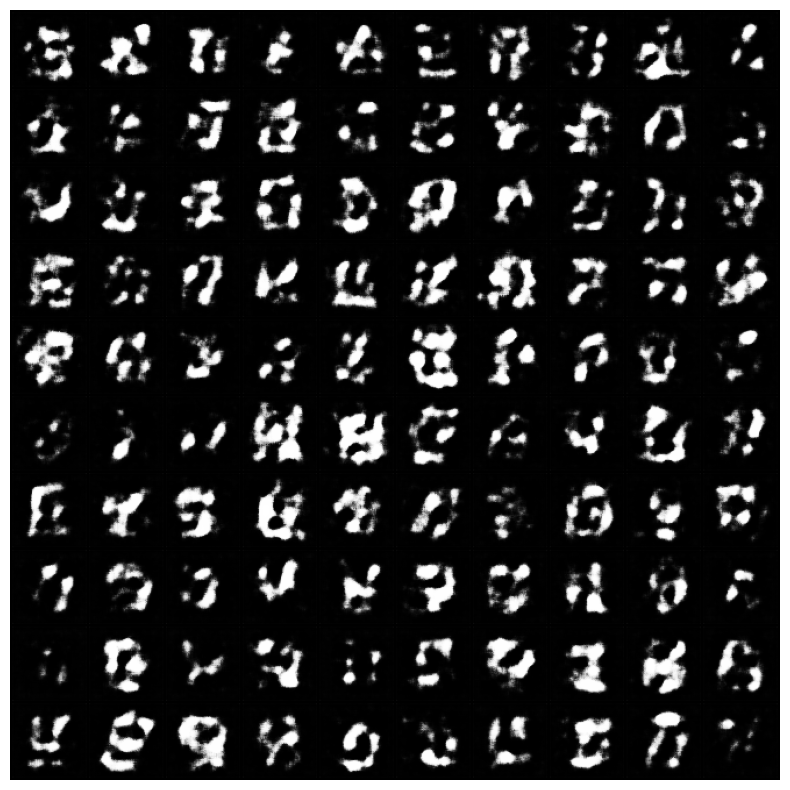

In [59]:
fig = plt.figure(figsize=(10, 10))
plt.axis("off")
ims = [[plt.imshow(item.permute(1, 2, 0), animated=True)] for item in img_list]
ani = animation.ArtistAnimation(fig,
                                ims,
                                interval=1000,
                                repeat_delay=1000,
                                blit=True)
HTML(ani.to_jshtml())


### Crypten

In [5]:
# import crypten
# import crypten.nn as nn
# import crypten.mpc as mpc
# import crypten.communicator as comm

# crypten.init()

# class Generator(crypten.nn.Module):
#     def __init__(self, ngpu):
#         super(Generator, self).__init__()
#         self.ngpu = ngpu
#         self.decon1 = crypten.nn.ConvTranspose2d(in_channels=nz, 
#                                                  out_channels=ngf*8,
#                                                  kernel_size=4, 
#                                                  stride=1, 
#                                                  padding=0,
#                                                  bias=False)
#         self.bn1 = crypten.nn.BatchNorm2d(ngf*8)
#         self.decon2 = crypten.nn.ConvTranspose2d(ngf*8, ngf*4, 4, stride=2, padding=1, bias=False)  
#         self.bn2 = crypten.nn.BatchNorm2d(ngf*4)
#         self.decon3 = crypten.nn.ConvTranspose2d(ngf*4, ngf*2, 4, stride=2, padding=1, bias=False)  
#         self.bn3 = crypten.nn.BatchNorm2d(ngf*2)
#         self.decon4 = crypten.nn.ConvTranspose2d(ngf*2, ngf, 4, stride=2, padding=1, bias=False)  
#         self.bn4 = crypten.nn.BatchNorm2d(ngf)
#         self.decon5 = crypten.nn.ConvTranspose2d(ngf, nc, 4, stride=2, padding=1, bias=False)
#         self.relu = crypten.nn.ReLU()

#     def forward(self, x):
#         x = self.relu(self.decon1(x))
#         x = self.bn1(x)
#         x = self.relu(self.decon2(x))
#         x = self.bn2(x)
#         x = self.relu(self.decon3(x))
#         x = self.bn3(x)
#         x = self.relu(self.decon4(x))
#         x = self.bn4(x)
#         x = self.decon5(x)
#         x = x.tanh()
#         return x
    
# class Discriminator(crypten.nn.Module):
#     def __init__(self, ngpu):
#         super(Discriminator, self).__init__()
#         self.ngpu = ngpu
#         self.nc = nc 
#         self.ndf = ndf
#         self.conv1 = crypten.nn.Conv2d(nc, ndf, 4, stride=2, padding=1, bias=False)  # (64, 14, 14)
#         self.leaky_relu = crypten.nn.LeakyRelu(0.2)
#         self.conv2 = crypten.nn.Conv2d(ndf, ndf * 2, 4, stride=2, padding=1, bias=False)  # (128, 7, 7)
#         self.bn1 = crypten.nn.BatchNorm2d(ndf * 2)
#         self.conv3 = crypten.nn.Conv2d(ndf * 2, ndf * 4, 4, stride=2, padding=1, bias=False)  # (256, 3, 3)
#         self.bn2 = crypten.nn.BatchNorm2d(ndf * 4)
#         self.conv4 = crypten.nn.Conv2d(ndf * 4, 1, 1, stride=1, padding=0, bias=False)  # (1, 1, 1)
#         # self.conv4 = nn.Conv2d(ndf * 4, 1, 4, stride=1, padding=0, bias=False)  # (1, 1, 1)
#         self.sd = crypten.nn.Sigmoid()

#     def forward(self, x):
#         x = self.leaky_relu(self.conv1(x))
#         x = self.conv2(x)
#         x = self.bn1(x)
#         x = self.leaky_relu(x)
#         x = self.leaky_relu(self.bn2(self.conv3(x)))
#         x = self.sd(self.conv4(x))

#         return x.view(x.size(0), -1).mean(dim=1)

/home/sue/Project/PR-crypten/CrypTen/crypten/__init__.py:64: RuntimeWarning: CrypTen is already initialized.
  warnings.warn("CrypTen is already initialized.", RuntimeWarning)


In [9]:
# # 创建一个生成器对象
# netG = Generator(ngpu).to(device)
# # 多卡并行，如果有多卡的话
# if device.type == 'cuda' and ngpu > 1:
#     netG = nn.DataParallel(netG, list(range(ngpu)))

# # # 初始化权重  其中，mean=0, stdev=0.2.
# # netG.apply(weights_init)
# for layer in netG.children():
#     weights_init(layer)

# # 创建一个判别器对象
# netD = Discriminator(ngpu).to(device)
# # 多卡并行，如果有多卡的话
# if device.type == 'cuda' and ngpu > 1:
#     netD = nn.DataParallel(netD, list(range(ngpu)))

# # # 初始化权重  其中，mean=0, stdev=0.2.
# # netD.apply(weights_init)
# for layer in netD.children():
#     weights_init(layer)

# dummy_input = torch.empty(64)

# netG.load_state_dict(torch.load('modelG.pt'), strict=True)
# netD.load_state_dict(torch.load('modelD.pt'), strict=True)

# print(netG)
# netD = netD.encrypt(src=0)
# netG = netG.encrypt(src=0)


Module._version: 1
Module._version: 1
Generator unencrypted module


In [10]:
# # Calculate losses
# def real_loss(D_out, smooth=False):
#     batch_size = D_out.size(0)
#     # label smoothing
#     if smooth:
#         # smooth, real labels = 0.9
#         labels = torch.ones(batch_size)*0.9
#     else:
#         labels = torch.ones(batch_size) # real labels = 1
        
#     # numerically stable loss
#     criterion = crypten.nn.BCELoss()
#     # criterion = nn.BCEWithLogitsLoss()

#     # # calculate loss
#     # eps = 2 ** -16
#     # y_pred = torch.clamp(D_out.squeeze(), eps, 1 - eps)  # eps 是一个很小的值，如 1e-7
#     # loss = criterion(y_pred, labels)

#     loss = criterion(D_out.squeeze(), labels)
#     return loss

# def fake_loss(D_out):
#     batch_size = D_out.size(0)
#     labels = torch.zeros(batch_size) # fake labels = 0
#     criterion = crypten.nn.BCELoss()
#     # criterion = nn.BCEWithLogitsLoss()

#     # # calculate loss
#     # eps = 2 ** -16
#     # y_pred = torch.clamp(D_out.squeeze(), eps, 1 - eps)  # eps 是一个很小的值，如 1e-7
#     # loss = criterion(y_pred, labels)
#     loss = criterion(D_out.squeeze(), labels)
#     return loss

In [11]:
optimizerG = crypten.optim.SGD(netG.parameters(), lr=1e-1)
optimizerD = crypten.optim.SGD(netD.parameters(), lr=1e-1)

In [12]:
# # 定义一些变量，用来存储每轮的相关值
# img_list = []
# img = []
# G_losses = []
# D_losses = []
# D_x_list = []
# D_z_list = []
# loss_tep = 10

# scaling_factor=1

# # 训练并存储高精度数据
# high_precision_data = []

# @mpc.run_multiprocess(world_size=2)
# def run():
#     print("Starting Training Loop...")
#     # 迭代
#     for epoch in range(num_epochs):
#         beg_time = time.time()
#         epoch_error = 0  # 初始化epoch误差
#         # 数据加载器读取数据
#         for i, data in enumerate(dataloader):
#             ############################
#             # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
#             ###########################
#             # 用所有的真数据进行训练
#             netD.zero_grad()
#             # Format batch
#             real_cpu = data[0].to(device)
#             # print("data's size:", real_cpu.size())
#             b_size = real_cpu.size(0)

#             # 判别器推理
#             # print(real_cpu)
#             print("b_size", b_size)
#             real_cpu = crypten.cryptensor(real_cpu)
#             output = netD(real_cpu).view(-1)
#             print("D_real_output:", output.get_plain_text())
#             # Calculate loss on all-real batch
#             # 计算所有真标签的损失函数
#             # errD_real = criterion(output, label)
#             errD_real = real_loss(output, smooth=True)

#             # Calculate gradients for D in backward pass
#             errD_real.backward()

#             D_x = output.mean().item()

#             # 生成假数据并进行训练
#             noise = torch.randn(b_size, nz, 1, 1, device=device)
#             noise = crypten.cryptensor(noise)

#             # 用生成器生成假图像
#             g_time = time.time()
#             fakeG = netG(noise)
#             # print("G(z):", fakeG)
#             g_end_time = time.time()
#             # print("SG-FP:",fake)
#             # print("Runtime\nSynthesis:", g_end_time-g_time)

#             # Classify all fake batch with D
#             d_time = time.time()
#             output = netD(fakeG.detach()).view(-1)
#             print("D_fake_output:", output.get_plain_text())

#             d_end_time = time.time()
#             # print("Runtime\nInference:", d_end_time-d_time)

#             # 计算判别器在假数据上的损失
#             # errD_fake = criterion(output, label)
#             # print("D(x1):", output)
#             errD_fake = fake_loss(output)
            
#             errD_fake.backward()

#             # for param in netD.parameters():
#             #     if param.grad is not None:
#             #         param.grad *= scaling_factor

#             D_G_z1 = output.mean().item()
#             # Add the gradients from the all-real and all-fake batches
#             errD = errD_real + errD_fake 
#             # errD = errD_real + errD_fake * 0.5 # 削弱对假样本的惩罚
#             # errD.backward()
            
#             # Update D
#             optimizerD.step()
#             # d_grad_norm = calculate_gradient_norm(netD)
#             # print(f"Discriminator Gradient Norm: {d_grad_norm:.4f}")
#             # if step % 2 == 0:
#             #     optimizerD.step()
#             # optimizerG.step()

#             ############################
#             # (2) Update G network: maximize log(D(G(z)))
#             ###########################
#             netG.zero_grad()

#             # Since we just updated D, perform another forward pass of all-fake batch through D
#             output = netD(fakeG).view(-1)
#             print("D_real2_output:", output.get_plain_text())

#             # Calculate G's loss based on this output
#             # errG = criterion(output, label)
#             # print("D(x2):", output)
#             errG = real_loss(output)
#             # errG = real_loss(output) * 0.5 # 减弱生成器压力
            
#             errG.backward()
#             # # ====================
#             # # 第二次训练Generator
#             # # ====================
#             # # 再次更新生成器
#             # netG.zero_grad()
#             # output = netD(fakeG).view(-1)  # 使用更新后的判别器
#             # errG = real_loss(output)
#             # errG.backward()  # 生成器的第二次反向传播
#             # optimizerG.step()
#             # # =========================
            
#             # for param in netG.parameters():
#             #     if param.grad is not None:
#             #         param.grad *= scaling_factor


#             D_G_z2 = output.mean().item()
#             # Update G
#             optimizerG.step()
#             # g_grad_norm = calculate_gradient_norm(netG)
#             # print(f"Generator Gradient Norm: {g_grad_norm:.4f}")

#             # Output training stats
#             end_time = time.time()
#             run_time = round(end_time - beg_time)
#             print(f'Epoch: [{epoch+1:0>{len(str(num_epochs))}}/{num_epochs}]',
#                 f'Step: [{i+1:0>{len(str(len(dataloader)))}}/{len(dataloader)}]',
#                 f'Loss-D: {errD.get_plain_text().item():.4f}',
#                 f'Loss-G: {errG.get_plain_text().item():.4f}',
#                 f'D(x): {D_x:.4f}',
#                 f'D(G(z)): [{D_G_z1:.4f}/{D_G_z2:.4f}]',
#                 f'Time: {run_time}s',
#                 end='\r')

#             # Save Losses for plotting later
#             G_losses.append(errG.get_plain_text().item())
#             D_losses.append(errD.get_plain_text().item())

            
#             # Save D(X) and D(G(z)) for plotting later
#             D_x_list.append(D_x)
#             D_z_list.append(D_G_z2)

#             # 保存最好的模型
#             if errG < loss_tep:
#                 torch.save(netG.state_dict(), 'model.pt')
#                 temp = errG

#         # Check how the generator is doing by saving G's output on fixed_noise
#         with torch.no_grad():
#             fake = netG(fixed_noise).detach().cpu()
#         img_list.append(utils.make_grid(fake.get_plain_text() * 0.5 + 0.5, nrow=10))
#         img.extend(fake.get_plain_text())  # 保存每张生成图像
#         print()

# run()


Starting Training Loop...Starting Training Loop...

b_size 64
b_size 64


KeyboardInterrupt: 

### Pytorch

In [ ]:
# # 定义一些变量，用来存储每轮的相关值
# img_list = []
# img = []
# G_losses = []
# D_losses = []
# D_x_list = []
# D_z_list = []
# loss_tep = 10

# scaling_factor=1

# # 训练并存储高精度数据
# high_precision_data = []

# print("Starting Training Loop...")
# # 迭代
# for epoch in range(num_epochs):
#     beg_time = time.time()
#     epoch_error = 0  # 初始化epoch误差
#     # 数据加载器读取数据
#     for i, data in enumerate(dataloader):
#         ############################
#         # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
#         ###########################
#         # 用所有的真数据进行训练
#         netD.zero_grad()
#         # Format batch
#         real_cpu = data[0].to(device)
#         # print("data's size:", real_cpu.size())
#         b_size = real_cpu.size(0)
#         label = torch.full((b_size, ),
#                            real_label,
#                            dtype=torch.float,
#                            device=device)

#         # 判别器推理
#         # print(real_cpu)
#         print("b_size", b_size)

#         output = netD(real_cpu).view(-1)
#         print("D_real_output:", output)
#         # Calculate loss on all-real batch
#         # 计算所有真标签的损失函数
#         # errD_real = criterion(output, label)
#         errD_real = real_loss(output, smooth=True)

#         # Calculate gradients for D in backward pass
#         errD_real.backward()

#         D_x = output.mean().item()

#         # 生成假数据并进行训练
#         noise = torch.randn(b_size, nz, 1, 1, device=device)
        
#         # 用生成器生成假图像
#         g_time = time.time()
#         fakeG = netG(noise)
#         # print("G(z):", fakeG)
#         g_end_time = time.time()
#         # print("SG-FP:",fake)
#         # print("Runtime\nSynthesis:", g_end_time-g_time)
#         label.fill_(fake_label)
#         # Classify all fake batch with D
#         d_time = time.time()
#         output = netD(fakeG.detach()).view(-1)
#         print("D_fake_output:", output)

#         d_end_time = time.time()
#         # print("Runtime\nInference:", d_end_time-d_time)

#         # 计算判别器在假数据上的损失
#         # errD_fake = criterion(output, label)
#         # print("D(x1):", output)
#         errD_fake = fake_loss(output)
        
#         errD_fake.backward()

#         # for param in netD.parameters():
#         #     if param.grad is not None:
#         #         param.grad *= scaling_factor

#         D_G_z1 = output.mean().item()
#         # Add the gradients from the all-real and all-fake batches
#         errD = errD_real + errD_fake 
#         # errD = errD_real + errD_fake * 0.5 # 削弱对假样本的惩罚
#         # errD.backward()
        
#         original_d_grads = [param.grad.clone() for param in netD.parameters()]
#         d_BP = []
#         for item in original_d_grads:
#             # print("item:",item.mean())
#             d_BP.append(item)
#         # print("SD-BP:", original_d_grads)
#         # Update D
#         optimizerD.step()
#         d_grad_norm = calculate_gradient_norm(netD)
#         # print(f"Discriminator Gradient Norm: {d_grad_norm:.4f}")
#         # if step % 2 == 0:
#         #     optimizerD.step()
#         # optimizerG.step()

#         ############################
#         # (2) Update G network: maximize log(D(G(z)))
#         ###########################
#         netG.zero_grad()
#         label.fill_(real_label)  # fake labels are real for generator cost
#         # Since we just updated D, perform another forward pass of all-fake batch through D
#         output = netD(fakeG).view(-1)
#         print("D_real2_output:", output)

#         # Calculate G's loss based on this output
#         # errG = criterion(output, label)
#         # print("D(x2):", output)
#         errG = real_loss(output)
#         # errG = real_loss(output) * 0.5 # 减弱生成器压力
        
#         errG.backward()
#         # # ====================
#         # # 第二次训练Generator
#         # # ====================
#         # # 再次更新生成器
#         # netG.zero_grad()
#         # output = netD(fakeG).view(-1)  # 使用更新后的判别器
#         # errG = real_loss(output)
#         # errG.backward()  # 生成器的第二次反向传播
#         # optimizerG.step()
#         # # =========================
        
#         # for param in netG.parameters():
#         #     if param.grad is not None:
#         #         param.grad *= scaling_factor


#         original_g_grads = [param.grad.clone() for param in netG.parameters()]
#         g_BP = []
#         for item in original_d_grads:
#             # print("item:",item.mean())
#             g_BP.append(item)

#         D_G_z2 = output.mean().item()
#         # Update G
#         optimizerG.step()
#         g_grad_norm = calculate_gradient_norm(netG)
#         # print(f"Generator Gradient Norm: {g_grad_norm:.4f}")

#         # Output training stats
#         end_time = time.time()
#         run_time = round(end_time - beg_time)
#         print(f'Epoch: [{epoch+1:0>{len(str(num_epochs))}}/{num_epochs}]',
#               f'Step: [{i+1:0>{len(str(len(dataloader)))}}/{len(dataloader)}]',
#               f'Loss-D: {errD.item():.4f}',
#               f'Loss-G: {errG.item():.4f}',
#               f'D(x): {D_x:.4f}',
#               f'D(G(z)): [{D_G_z1:.4f}/{D_G_z2:.4f}]',
#               f'Time: {run_time}s',
#               end='\r')

#         # Save Losses for plotting later
#         G_losses.append(errG.item())
#         D_losses.append(errD.item())

        
#         # Save D(X) and D(G(z)) for plotting later
#         D_x_list.append(D_x)
#         D_z_list.append(D_G_z2)

#         # 保存最好的模型
#         if errG < loss_tep:
#             torch.save(netG.state_dict(), 'model.pt')
#             temp = errG

#     # Check how the generator is doing by saving G's output on fixed_noise
#     with torch.no_grad():
#         fake = netG(fixed_noise).detach().cpu()
#     img_list.append(utils.make_grid(fake * 0.5 + 0.5, nrow=10))
#     img.extend(fake)  # 保存每张生成图像
#     print()

#     # print("G-FP:",fakeG.mean())
#     # print("D-FP:",output.mean())
#     # print("G-BP:",g_BP)
#     # print("D-BP:",d_BP)

#     high_precision_data.append({
#         "true_loss": errD.item(),
#         "true_gradients": original_g_grads,
#     })
#     print(f"\nEpoch {epoch+1} complete, true_loss and gradients stored.")
#     # 将高精度数据保存到文件
#     with open("high_precision_data.pkl", "wb") as f:
#         pickle.dump(high_precision_data, f)


Starting Training Loop...
b_size 64


AttributeError: 'Tensor' object has no attribute 'conv2d'

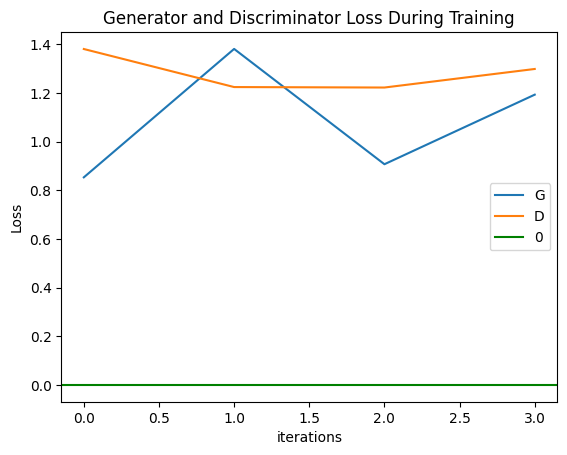

In [ ]:
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses[::100], label="G")
plt.plot(D_losses[::100], label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.axhline(y=0, label="0", c="g")  # asymptote
plt.legend()
plt.savefig("result/loss_curves.png")

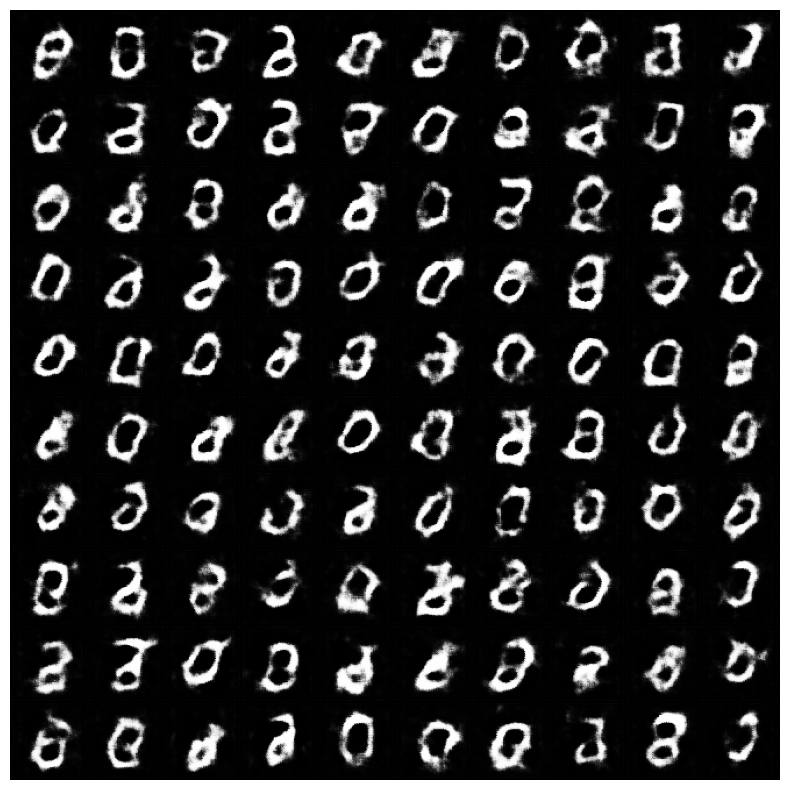

In [ ]:
fig = plt.figure(figsize=(10, 10))
plt.axis("off")
ims = [[plt.imshow(item.permute(1, 2, 0), animated=True)] for item in img_list]
ani = animation.ArtistAnimation(fig,
                                ims,
                                interval=1000,
                                repeat_delay=1000,
                                blit=True)
HTML(ani.to_jshtml())


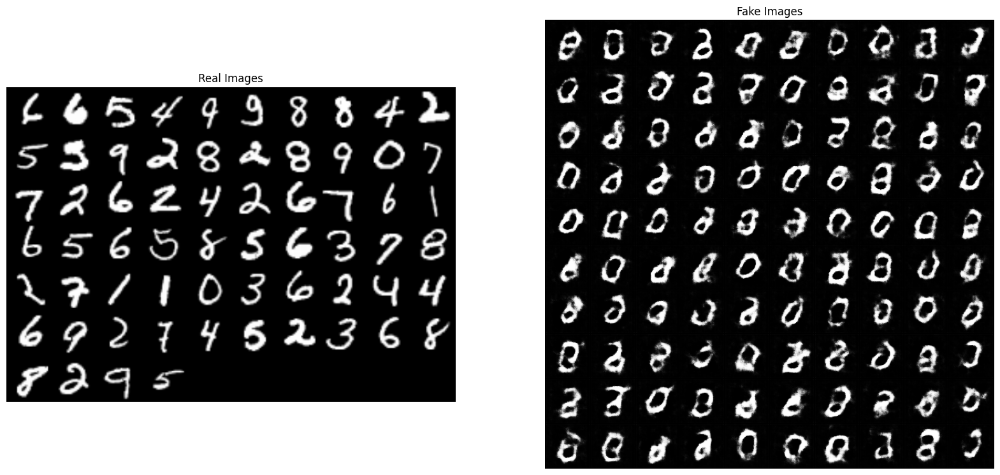

In [ ]:
# Size of the Figure
plt.figure(figsize=(20, 10))

# Plot the real images
plt.subplot(1, 2, 1)
plt.axis("off")
plt.title("Real Images")
real = next(iter(dataloader))
plt.imshow(
    utils.make_grid(real[0][:100] * 0.5 + 0.5, nrow=10).permute(1, 2, 0))

# Load the Best Generative Model
netG = Generator(0)
netG.load_state_dict(torch.load('model.pt', map_location=torch.device('cpu')))
netG.eval()

# Generate the Fake Images
with torch.no_grad():
    fake = netG(fixed_noise.cpu())

# Plot the fake images
plt.subplot(1, 2, 2)
plt.axis("off")
plt.title("Fake Images")
fake = utils.make_grid(fake * 0.5 + 0.5, nrow=10)
plt.imshow(fake.permute(1, 2, 0))

# Save the comparation result
plt.savefig('result/result.jpg', bbox_inches='tight')


In [ ]:
# import numpy as np

# dataroot = "../data/MNIST"  # 数据集所在的路径，我们已经事先下载下来了
# workers = 0  # 数据加载时的进程数
# batch_size = 64  # 生成器输入的大小

# image_size = 64  # 训练图像的大小
# nc = 1  # 训练图像的通道数，彩色图像的话就是 3
# nz = 100  # 输入是100 维的随机噪声 z，看作是 100 个 channel，每个特征图宽高是 1*1
# ngf = 64  # 生成器中特征图的大小，
# ndf = 64  # 判别器中特征图的大小
# num_epochs = 5  # 训练的轮次
# # num_epochs = 10  # 训练的轮次
# lr = 0.0005  # 学习率大小
# beta1 = 0.5  # Adam 优化器的参数
# ngpu = 1  # 可用 GPU  的个数，0 代表使用 CPU

# # 训练集加载并进行归一化等操作
# train_data = datasets.MNIST(
#     root=dataroot,
#     train=True,
#     transform=transforms.Compose([
#         transforms.Resize(image_size),
#         transforms.ToTensor(),
#         transforms.Normalize((0.5, ), (0.5, ))
#     ]),
#     download=True  # 从互联网下载，如果已经下载的话，就直接使用
# )

# # 测试集加载并进行归一化等操作
# test_data = datasets.MNIST(root=dataroot,
#                            train=False,
#                            transform=transforms.Compose([
#                                transforms.Resize(image_size),
#                                transforms.ToTensor(),
#                                transforms.Normalize((0.5, ), (0.5, ))
#                            ]))

# # 把 MNIST 的训练集和测试集都用来做训练
# # dataset = train_data + test_data
# # dataset = train_data

# from torch.utils.data import Subset
# # 选择训练集的前 5000 张数据
# subset_indices = list(range(20000))  # 创建索引范围
# dataset = Subset(train_data, subset_indices)

# print(f'Total Size of Dataset: {len(dataset)}')

# # 数据加载器，训练过程中不断产生数据
# dataloader = DataLoader(dataset=dataset,
#                         batch_size=batch_size,
#                         shuffle=True,
#                         num_workers=workers)


# # Obtain one batch of training images
# dataiter = iter(dataloader)
# images, labels = next(dataiter)

# images = images.numpy()

# # get one image from the batch
# img = np.squeeze(images[0])

# fig = plt.figure(figsize = (3,3)) 
# ax = fig.add_subplot(111)
# ax.axis('off')  # 隐藏坐标轴
# ax.imshow(img, cmap='gray')

In [ ]:
from torchvision import models, transforms
import torch.nn.functional as F
import torch

# 加载预训练的Inception模型
inception_model = models.inception_v3(weights='DEFAULT', transform_input=False)  # 使用 weights 代替 pretrained
inception_model.eval()

# 定义图像预处理操作
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# 定义Inception Score计算函数
def inception_score(img_list, inception_model, num_splits=10):
    inception_model.eval()
    preds = []

    with torch.no_grad():
        for img in img_list:
            # 如果图像是单通道，扩展为三个通道
            if img.size(0) == 1:  # 检查是否为单通道图像
                img = img.expand(3, -1, -1)  # 复制单通道数据到三个通道
            
            img = transform(img)
            img = img.unsqueeze(0)  # 增加batch维度
            img = img.to('cpu')  # 如果inception模型在cpu上
            pred = inception_model(img)[0]
            preds.append(pred)

    preds = torch.stack(preds)
    preds = F.softmax(preds, dim=1)
    split_scores = []
    for k in range(num_splits):
        part = preds[k * (len(preds) // num_splits): (k + 1) * (len(preds) // num_splits), :]
        p_y = part.mean(0)
        kl_divergence = part * (torch.log(part) - torch.log(p_y.unsqueeze(0)))
        kl_divergence = kl_divergence.sum(1)
        split_scores.append(kl_divergence.mean().exp())

    return torch.tensor(split_scores).mean().item(), torch.tensor(split_scores).std().item()

# 在训练循环结束后评估Inception Score
mean_inception_score, std_inception_score = inception_score(img, inception_model)
print(f"Inception Score: {mean_inception_score:.4f} ± {std_inception_score:.4f}")


Inception Score: 2.0644 ± 0.1659
